In [1]:
!git clone https://github.com/dhrubomondol66/AnimeGANv2-checkpoint.git


Cloning into 'AnimeGANv2-checkpoint'...
remote: Enumerating objects: 33, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 33 (delta 11), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (33/33), 45.55 MiB | 19.85 MiB/s, done.
Resolving deltas: 100% (11/11), done.


In [3]:
import os

# Change the path to where you saved the AnimeGANv2 folder
cartoongan_folder = 'AnimeGANv2-checkpoint'
os.chdir(cartoongan_folder)

ANIME CHARACTER TRANSFORMER - Model: Shinkai
Transforms photos into anime-style characters

Upload your photo:


Saving Tour_Eiffel_Wikimedia_Commons_(cropped).jpg.webp to Tour_Eiffel_Wikimedia_Commons_(cropped).jpg.webp

✓ Input shape: (1599, 960, 3)

✓ Pre-processing for anime character style...
✓ Loading AnimeGAN model...
✓ Transforming into anime character...
✓ Enhancing anime character features...

✓ SUCCESS! Saved 4 versions:
  1. Basic: /content/drive/MyDrive/Dataset/cartoon_output/Tour_Eiffel_Wikimedia_Commons_(cropped).jpg_basic.jpg
  2. Enhanced: /content/drive/MyDrive/Dataset/cartoon_output/Tour_Eiffel_Wikimedia_Commons_(cropped).jpg_enhanced.jpg
  3. With Lines: /content/drive/MyDrive/Dataset/cartoon_output/Tour_Eiffel_Wikimedia_Commons_(cropped).jpg_with_lines.jpg
  4. Maximum Anime: /content/drive/MyDrive/Dataset/cartoon_output/Tour_Eiffel_Wikimedia_Commons_(cropped).jpg_maximum.jpg

--- ORIGINAL ---


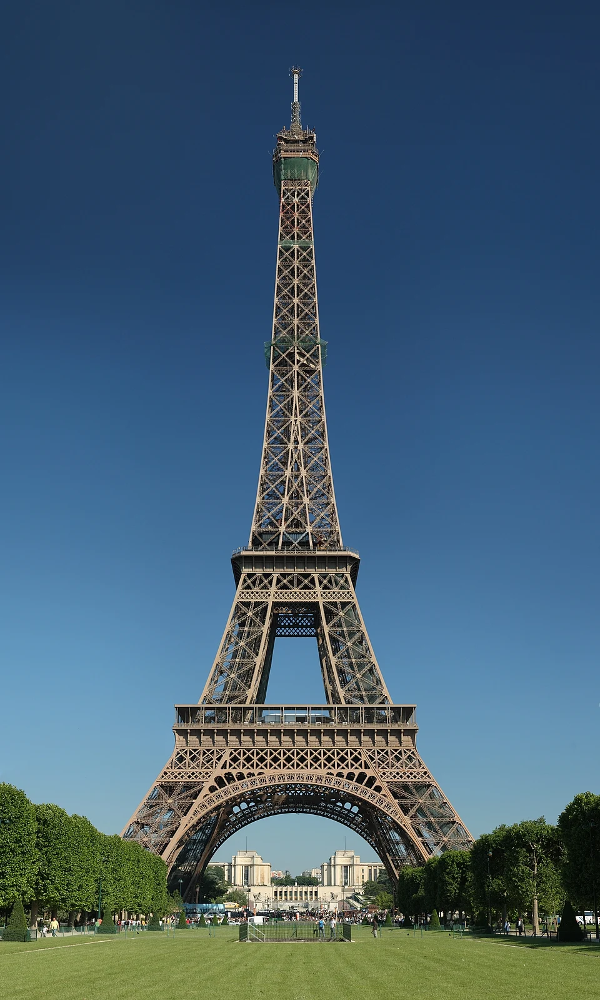


--- BASIC ANIME ---


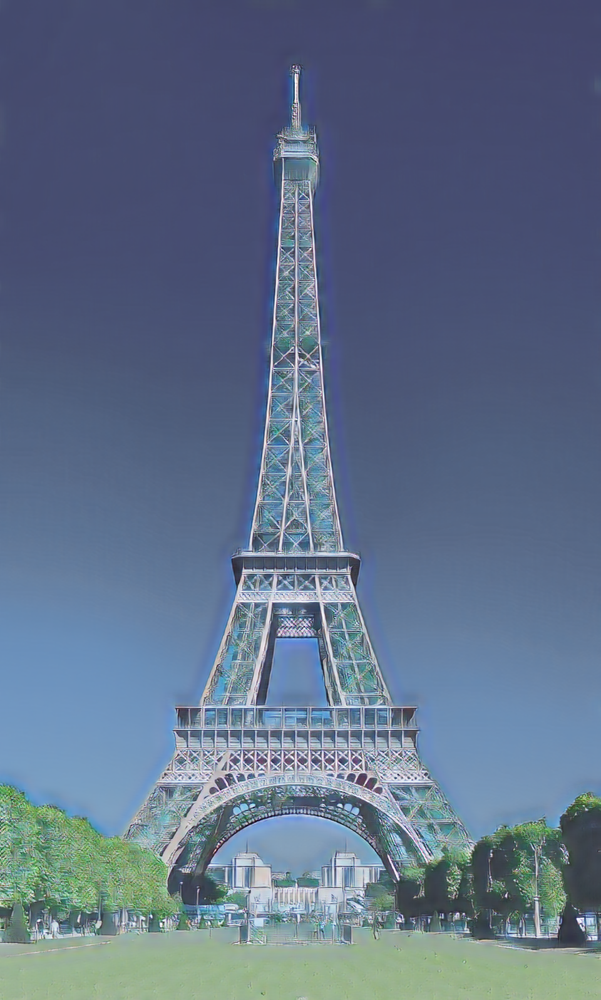


--- ENHANCED ANIME CHARACTER ---


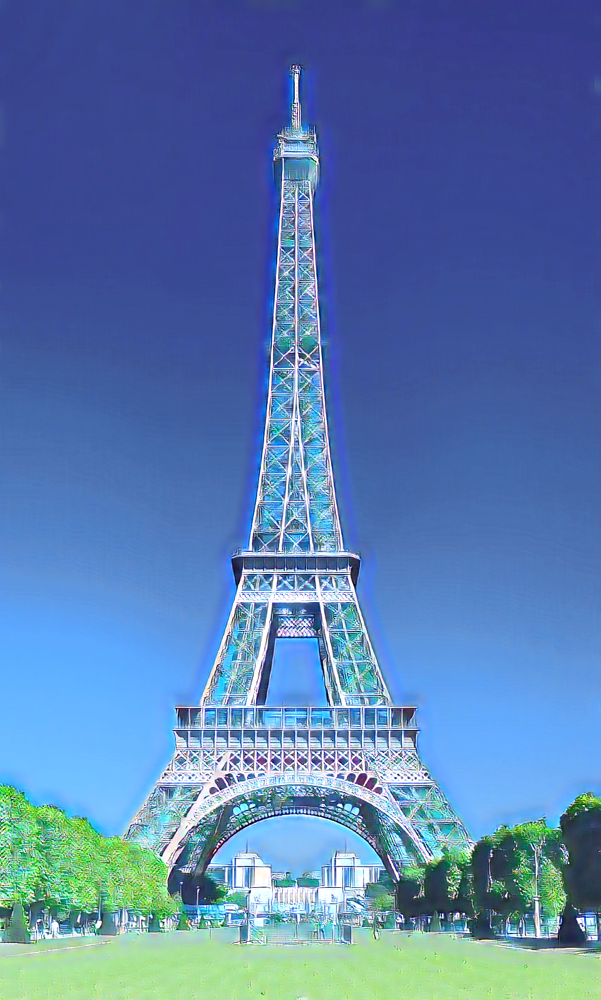


--- WITH ANIME LINES ---


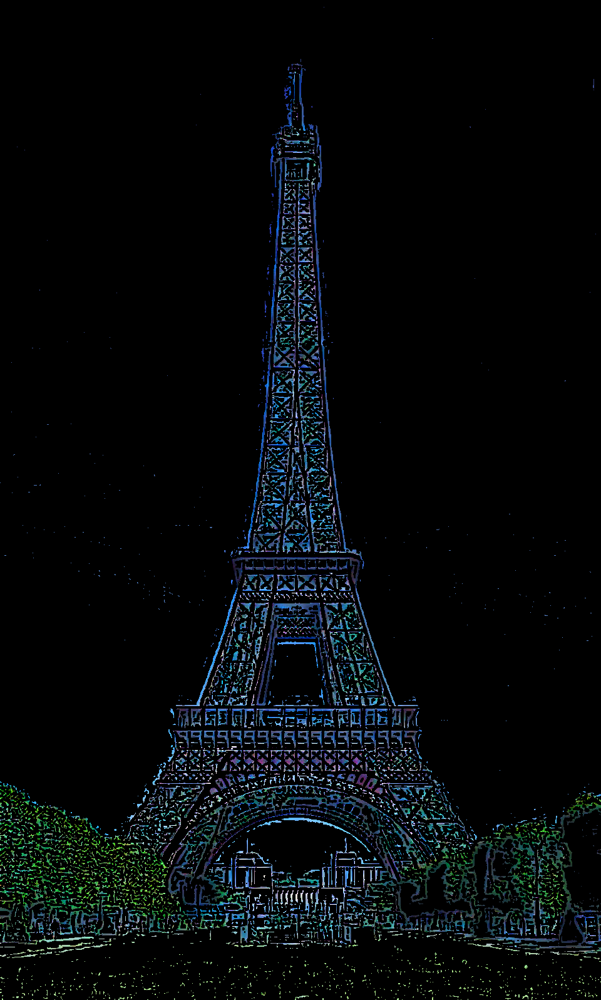


--- MAXIMUM ANIME EFFECT ---


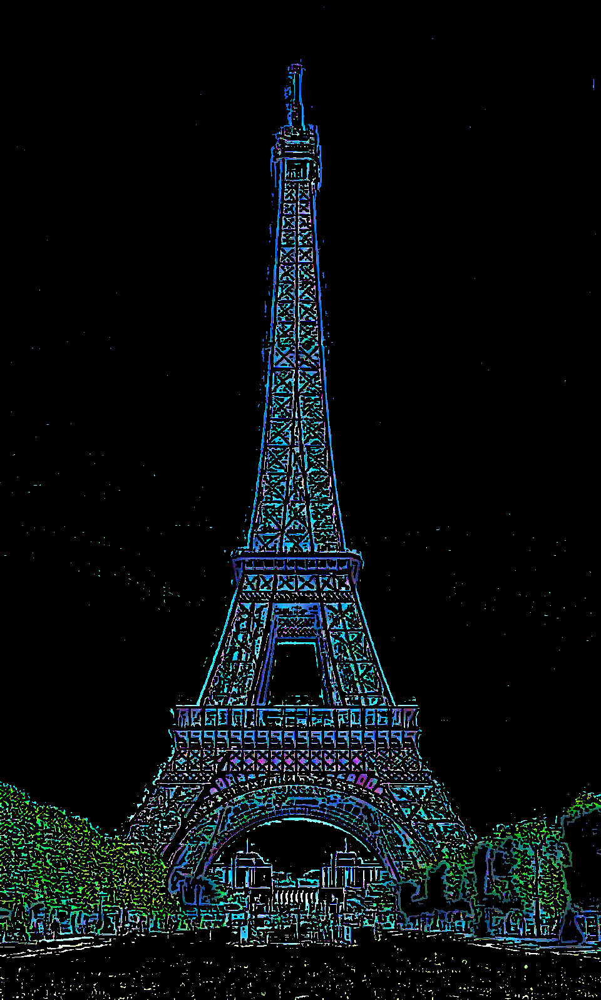


--- COMPARISON GRID ---
(Top: Original | Basic | Bottom: Enhanced | Maximum)


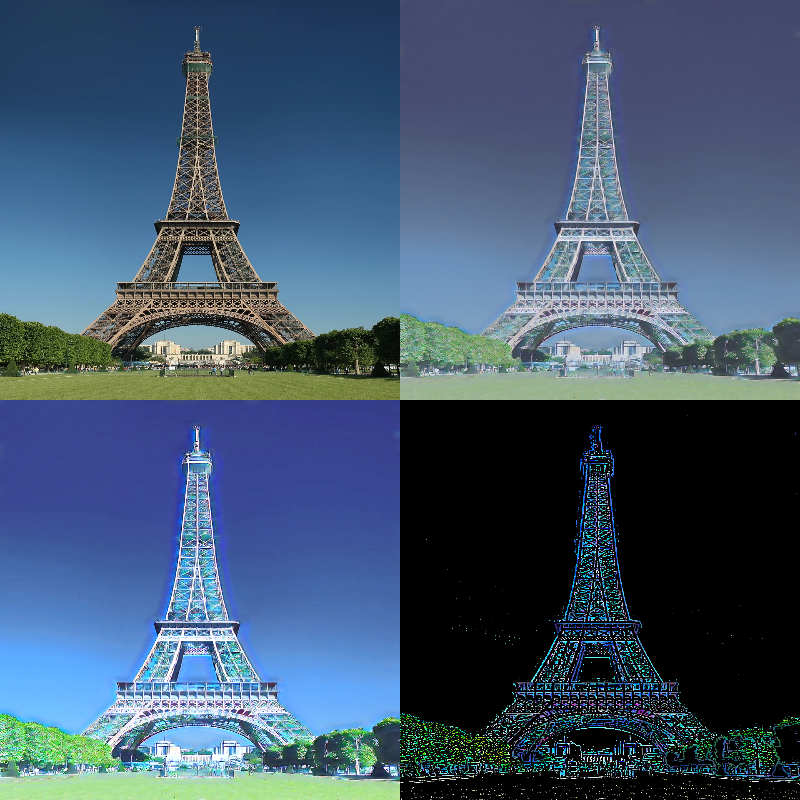


TIPS FOR BETTER ANIME CHARACTER RESULTS:
  1. Use clear, well-lit photos of faces
  2. Front-facing photos work best
  3. Try 'Hayao' model for Ghibli-style characters
  4. Try 'Shinkai' model for realistic anime style
  5. Try 'Paprika' model for vibrant anime colors


In [5]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()  # Disable TensorFlow 2.x behavior to use 1.x

import numpy as np
import cv2
from PIL import Image, ImageEnhance, ImageFilter
import os
from google.colab import files
from IPython.display import display # Import display for Colab

model_name = "Shinkai"  # Shinkai style works best for realistic anime characters

# The checkpoints were cloned into the current working directory ('AnimeGANv2-checkpoint')
# after the `os.chdir()` command. So, we should look for them relative to the current directory.
# The `generator_weight_path` should be the prefix for the checkpoint files.
generator_weight_path = f'generator_{model_name}_weight' # Correct path to the weight prefix

checkpoint_path = tf.train.latest_checkpoint(generator_weight_path) # Get the latest checkpoint file

# Add a check to ensure checkpoint_path is not None before proceeding
if checkpoint_path is None:
    raise FileNotFoundError(f"No checkpoint found for model '{model_name}' at '{generator_weight_path}'.\nPlease ensure the checkpoint files (e.g., .data, .index, .meta) are directly in the current directory ('AnimeGANv2-checkpoint').")

meta_path = checkpoint_path + '.meta' # Construct meta path from the actual checkpoint file

print("="*70)
print(f"ANIME CHARACTER TRANSFORMER - Model: {model_name}")
print("Transforms photos into anime-style characters")
print("="*70)

# Create generator using low-level TF operations
def conv2d(x, output_channels, kernel_size, strides=1, padding='SAME', use_bias=True, name=None):
    with tf.variable_scope(name, reuse=tf.AUTO_REUSE):
        input_channels = x.get_shape().as_list()[-1]
        kernel_shape = [kernel_size, kernel_size, input_channels, output_channels]

        kernel = tf.get_variable('kernel', kernel_shape,
                                initializer=tf.truncated_normal_initializer(stddev=0.02))

        conv = tf.nn.conv2d(x, kernel, [1, strides, strides, 1], padding=padding)

        if use_bias:
            bias = tf.get_variable('bias', [output_channels],
                                  initializer=tf.zeros_initializer())
            conv = tf.nn.bias_add(conv, bias)

        return conv

def instance_norm(x, name='instance_norm'):
    with tf.variable_scope(name, reuse=tf.AUTO_REUSE):
        depth = x.get_shape()[3]
        scale = tf.get_variable('scale', [depth], initializer=tf.ones_initializer())
        offset = tf.get_variable('offset', [depth], initializer=tf.zeros_initializer())

        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        epsilon = 1e-5
        normalized = (x - mean) / tf.sqrt(variance + epsilon)

        return scale * normalized + offset

def resblock(x, filters, name='resblock'):
    with tf.variable_scope(name, reuse=tf.AUTO_REUSE):
        shortcut = x

        h = conv2d(x, filters, 3, name='conv1')
        h = instance_norm(h, name='in1')
        h = tf.nn.relu(h)

        h = conv2d(h, filters, 3, name='conv2')
        h = instance_norm(h, name='in2')

        return shortcut + h

def upsample(x, output_channels, name='upsample'):
    with tf.variable_scope(name, reuse=tf.AUTO_REUSE):
        # Get dynamic shape
        shape = tf.shape(x)
        new_h = shape[1] * 2
        new_w = shape[2] * 2

        # Resize
        x = tf.image.resize_bilinear(x, [new_h, new_w], align_corners=True)

        # Conv
        x = conv2d(x, output_channels, 3, name='conv')

        return x

def generator(inputs, reuse=False):
    with tf.variable_scope('generator', reuse=reuse):
        # Encoder
        x = tf.pad(inputs, [[0,0],[3,3],[3,3],[0,0]], 'REFLECT')
        x = conv2d(x, 64, 7, padding='VALID', name='enc_conv1')
        x = instance_norm(x, 'enc_in1')
        x = tf.nn.relu(x)

        x = conv2d(x, 128, 3, strides=2, name='enc_conv2')
        x = conv2d(x, 128, 3, name='enc_conv2_1')
        x = instance_norm(x, 'enc_in2')
        x = tf.nn.relu(x)

        x = conv2d(x, 256, 3, strides=2, name='enc_conv3')
        x = conv2d(x, 256, 3, name='enc_conv3_1')
        x = instance_norm(x, 'enc_in3')
        x = tf.nn.relu(x)

        # ResBlocks
        for i in range(8):
            x = resblock(x, 256, name=f'resblock_{i}')

        # Decoder
        x = upsample(x, 128, name='dec_upsample1')
        x = conv2d(x, 128, 3, name='dec_conv1')
        x = instance_norm(x, 'dec_in1')
        x = tf.nn.relu(x)

        x = upsample(x, 64, name='dec_upsample2')
        x = conv2d(x, 64, 3, name='dec_conv2')
        x = instance_norm(x, 'dec_in2')
        x = tf.nn.relu(x)

        x = tf.pad(x, [[0,0],[3,3],[3,3],[0,0]], 'REFLECT')
        x = conv2d(x, 3, 7, padding='VALID', use_bias=False, name='dec_conv_out')
        output = tf.nn.tanh(x)

        return output
def apply_anime_face_transform(image):
    """Apply transformations to make faces more anime-like"""

    img_pil = Image.fromarray(image)

    # 1. Detect face (if possible) and apply specific transformations
    try:
        img_cv = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

        gray = cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 4)

        if len(faces) > 0:
            print(f"✓ Detected {len(faces)} face(s)")
            for (x, y, w, h) in faces:
                face_region = image[y:y+h, x:x+w]
    except Exception as e:
        print(f"Face detection skipped: {e}")

    # 2. Smooth skin areas (anime has smooth skin)
    img_array = np.array(img_pil)
    smoothed = cv2.bilateralFilter(img_array, 15, 80, 80)

    # 3. Sharpen edges (anime has sharp lines)
    sharpened = Image.fromarray(smoothed)
    sharpened = sharpened.filter(ImageFilter.SHARPEN)
    sharpened = sharpened.filter(ImageFilter.SHARPEN)  # Apply twice for stronger effect

    return np.array(sharpened)
def enhance_anime_style(image):
    """Post-process to enhance anime character look"""

    img_pil = Image.fromarray(image)

    enhancer = ImageEnhance.Color(img_pil)
    img_pil = enhancer.enhance(1.5)

    enhancer = ImageEnhance.Contrast(img_pil)
    img_pil = enhancer.enhance(1.3)

    enhancer = ImageEnhance.Sharpness(img_pil)
    img_pil = enhancer.enhance(2.0)

    enhancer = ImageEnhance.Brightness(img_pil)
    img_pil = enhancer.enhance(1.1)

    return np.array(img_pil)
def create_anime_lines(image):
    """Create clean anime-style line art overlay"""

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                  cv2.THRESH_BINARY, 9, 2)

    edges = cv2.bitwise_not(edges)

    kernel = np.ones((2, 2), np.uint8)
    edges = cv2.erode(edges, kernel, iterations=1)

    edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
    result = cv2.multiply(image.astype(float), edges_rgb.astype(float) / 255.0)
    result = np.clip(result, 0, 255).astype(np.uint8)

    return result
# Upload image
print("\nUpload your photo:")
uploaded = files.upload()

for filename in uploaded.keys():
    output_base = '/content/drive/MyDrive/Dataset/cartoon_output/' + filename[:-5]

    # Read image
    img_original = cv2.imread(filename)
    if img_original is None:
        raise ValueError(f"Could not read: {filename}")

    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)
    print(f"\n✓ Input shape: {img_original.shape}")

    # Apply anime face transformations
    print("\n✓ Pre-processing for anime character style...")
    img_preprocessed = apply_anime_face_transform(img_original)

    # Normalize and process through AnimeGANv2
    img = img_preprocessed.astype(np.float32) / 127.5 - 1.0
    img = np.expand_dims(img, 0)

    # Load model and generate
    tf.reset_default_graph()

    with tf.Session() as sess:
        print("✓ Loading AnimeGAN model...")
        saver = tf.train.import_meta_graph(meta_path)
        saver.restore(sess, checkpoint_path)

        graph = tf.get_default_graph()

        # Find tensors dynamically
        input_tensor = None
        output_tensor = None

        possible_inputs = ['test:0', 'input:0', 'generator_input:0', 'Placeholder:0']
        possible_outputs = ['output:0', 'generator_output:0', 'fake:0', 'generated:0']

        for name in possible_inputs:
            try:
                input_tensor = graph.get_tensor_by_name(name)
                break
            except:
                continue

        for name in possible_outputs:
            try:
                output_tensor = graph.get_tensor_by_name(name)
                break
            except:
                continue

        if input_tensor is None or output_tensor is None:
            ops = graph.get_operations()
            placeholders = [op for op in ops if op.type == 'Placeholder']
            tanh_ops = [op for op in ops if op.type == 'Tanh']

            if placeholders and input_tensor is None:
                input_tensor = graph.get_tensor_by_name(placeholders[0].name + ':0')
            if tanh_ops and output_tensor is None:
                output_tensor = graph.get_tensor_by_name(tanh_ops[-1].name + ':0')

        if input_tensor is None or output_tensor is None:
            raise ValueError("Could not find input or output tensors in the graph.")

        # Run inference
        print("✓ Transforming into anime character...")
        result = sess.run(output_tensor, feed_dict={input_tensor: img})

        # Postprocess
        result = result.squeeze()
        result = (result + 1.0) / 2.0 * 255.0
        result = np.clip(result, 0, 255).astype(np.uint8)

        # Apply anime character enhancements
        print("✓ Enhancing anime character features...")

        # Version 1: Standard with enhancements
        result_enhanced = enhance_anime_style(result)

        # Version 2: With anime line art
        result_with_lines = create_anime_lines(result_enhanced)

        # Version 3: Maximum anime effect
        result_max = enhance_anime_style(result_with_lines)

        # Save all versions
        os.makedirs(os.path.dirname(output_base), exist_ok=True)

        Image.fromarray(result).save(f"{output_base}_basic.jpg")
        Image.fromarray(result_enhanced).save(f"{output_base}_enhanced.jpg")
        Image.fromarray(result_with_lines).save(f"{output_base}_with_lines.jpg")
        Image.fromarray(result_max).save(f"{output_base}_maximum.jpg")

        print(f"\n✓ SUCCESS! Saved 4 versions:")
        print(f"  1. Basic: {output_base}_basic.jpg")
        print(f"  2. Enhanced: {output_base}_enhanced.jpg")
        print(f"  3. With Lines: {output_base}_with_lines.jpg")
        print(f"  4. Maximum Anime: {output_base}_maximum.jpg")

        # Display all versions
        print("\n--- ORIGINAL ---")
        display(Image.fromarray(img_original))

        print("\n--- BASIC ANIME ---")
        display(Image.fromarray(result))

        print("\n--- ENHANCED ANIME CHARACTER ---")
        display(Image.fromarray(result_enhanced))

        print("\n--- WITH ANIME LINES ---")
        display(Image.fromarray(result_with_lines))

        print("\n--- MAXIMUM ANIME EFFECT ---")
        display(Image.fromarray(result_max))

        # Create comparison grid
        h, w = 400, 400 # Adjusted size for better display in Colab
        comparison = np.vstack([
            np.hstack([
                cv2.resize(img_original, (w, h)),
                cv2.resize(result, (w, h))
            ]),
            np.hstack([
                cv2.resize(result_enhanced, (w, h)),
                cv2.resize(result_max, (w, h))
            ])
        ])

        comparison_path = f"{output_base}_comparison_grid.jpg"
        Image.fromarray(comparison).save(comparison_path)

        print("\n--- COMPARISON GRID ---")
        print("(Top: Original | Basic | Bottom: Enhanced | Maximum)")
        display(Image.fromarray(comparison))

print("\n" + "="*70)
print("TIPS FOR BETTER ANIME CHARACTER RESULTS:")
print("  1. Use clear, well-lit photos of faces")
print("  2. Front-facing photos work best")
print("  3. Try 'Hayao' model for Ghibli-style characters")
print("  4. Try 'Shinkai' model for realistic anime style")
print("  5. Try 'Paprika' model for vibrant anime colors")
print("="*70)